### Project Details - Regression

1. Objective
2. Data Description & Cleaning
3. Wrangling & EDA (in Phython, SQL & Tableau)
4. Data Processing 
5. Applying the Model
6. Validating the Model
7. Displaying Prediction
8. Conclusion

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
pd.set_option('display.max_columns', None)
from ydata_profiling import ProfileReport

#from scipy.stats import norm
#from scipy.stats import expon
#from scipy import stats

from sklearn.preprocessing import StandardScaler
#from sklearn.preprocessing import MinMaxScaler
#from sklearn.preprocessing import Normalizer

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from collections import defaultdict

import warnings
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_excel('regression_data.xls')
data.head()

,id,date,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price
0,7129300520,2014-10-13,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,221900
1,6414100192,2014-12-09,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,538000
2,5631500400,2015-02-25,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,180000
3,2487200875,2014-12-09,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,604000
4,1954400510,2015-02-18,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,510000


### 1. Objective

**Objective**: 

The task is to build a model that will predict the price of a house based on features provided in the dataset. One of those parameters include understanding which factors are responsible for higher property value - \$650K and above. In short:

**“Predict selling prices of houses in King County, WA”**

### 2. Data Description & Cleaning

In [3]:
# Checking the datatypes. 
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21597 non-null  int64         
 1   date           21597 non-null  datetime64[ns]
 2   bedrooms       21597 non-null  int64         
 3   bathrooms      21597 non-null  float64       
 4   sqft_living    21597 non-null  int64         
 5   sqft_lot       21597 non-null  int64         
 6   floors         21597 non-null  float64       
 7   waterfront     21597 non-null  int64         
 8   view           21597 non-null  int64         
 9   condition      21597 non-null  int64         
 10  grade          21597 non-null  int64         
 11  sqft_above     21597 non-null  int64         
 12  sqft_basement  21597 non-null  int64         
 13  yr_built       21597 non-null  int64         
 14  yr_renovated   21597 non-null  int64         
 15  zipcode        2159

In [4]:
# We are exploring the categories of the different variables to confirm the datatypes assigned.
data['view'].unique()

# data['id'].nunique()
# data['sqft_lot'].unique().max()
# data['bedrooms'].value_counts()

array([0, 3, 4, 2, 1], dtype=int64)

**From a first exploration, we can derive the following information:**

- **id**: identification number for the property (21,420 properties are listed)
- **date**: date the house was sold (between May 2014 and May 2015)
- **bedrooms**: no. of bedrooms (between 1 and 33 bedrooms)
- **bathrooms**: no. of bathrooms (between 0.5 and 8 bathrooms)
- **sqft_living**: size of living area (between 370 and 13,540 sqft)
- **sqft_lot**: size of lot (between 520 and 1,651,359 sqft)
- **floors**: no. of floors (between 1 and 3.5 floors)
- **waterfront**: house which has a view to a waterfront (**1** with waterfront and **0** without)
- **view**: no. of times the house has been viewed by potential buyers (between 0 and 4 views)
- **condition**: how good the condition is (overall) (**1** indicates worn out property and **5** excellent)
- **grade**: overall grade given to the housing unit (**1** poor ,**13** excellent, properties between 3 and 13)
- **sqft_above**: square footage of house apart from basement
- **sqft_basement**: square footage of basement
- **yr_built**: year the house was built (between 1900 and 2015)
- **yr_renovated**: year the house was renovated (**0** never, or between 1934 and 2015)
- **zipcode**: zipcode of the location 
- **lat**: geographical latitude of the location
- **long**: geographical longitude of the location
- **sqft_living15**: living area in 2015 (implies previous renovations), this might have affected the lot size
- **sqft_lot15**: lot size in 2015 (implies previous renovations)
- **price**: price of the house (our target, between 78,000 and 7,700,000)

The id should be treated as a categorical value, since it is an identifier, not a discrete or continous numerical.

The zipcode will be treated as a categorical feature because we plan to use it to group or categorize properties by location (which entails other relevant factors such as demographic or socio-economic factors not provided in the dataset).

Hence the columns 'id' and 'zipcode' related to the location have to be changed to format 'object'.
The same applies to 'waterfront' (with or without) and 'view' (no. of views meaning interest in the property), 'condition' (rating of condition by 5 categories), and 'grade' (rating of grade from 1 to 13). They are categorical variables, but since they are already in the format of ordinal encoding/dummified, we want to use them as they are for the model.

In [5]:
# We change the datatype from int to object.
data[['id', 'zipcode']] = data[['id', 'zipcode']].astype(object)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21597 non-null  object        
 1   date           21597 non-null  datetime64[ns]
 2   bedrooms       21597 non-null  int64         
 3   bathrooms      21597 non-null  float64       
 4   sqft_living    21597 non-null  int64         
 5   sqft_lot       21597 non-null  int64         
 6   floors         21597 non-null  float64       
 7   waterfront     21597 non-null  int64         
 8   view           21597 non-null  int64         
 9   condition      21597 non-null  int64         
 10  grade          21597 non-null  int64         
 11  sqft_above     21597 non-null  int64         
 12  sqft_basement  21597 non-null  int64         
 13  yr_built       21597 non-null  int64         
 14  yr_renovated   21597 non-null  int64         
 15  zipcode        2159

In [6]:
# Now, we are checking for NaNs. There are none.
data.isna().sum()

id               0
date             0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
price            0
dtype: int64

In [7]:
# Checking for duplicates.
duplicates = data[data.duplicated(subset='id', keep=False)]

# We add a new column 'is_duplicate' to the duplicates dataframe
duplicates['is_duplicate'] = True

if duplicates.empty:
    print("No duplicates found")
else:
    print("Duplicates found:\n", duplicates)

Duplicates found:
                id       date  bedrooms  bathrooms  sqft_living  sqft_lot  \
93     6021501535 2014-07-25         3       1.50         1580      5000   
94     6021501535 2014-12-23         3       1.50         1580      5000   
313    4139480200 2014-06-18         4       3.25         4290     12103   
314    4139480200 2014-12-09         4       3.25         4290     12103   
324    7520000520 2014-09-05         2       1.00         1240     12092   
...           ...        ...       ...        ...          ...       ...   
20654  8564860270 2015-03-30         4       2.50         2680      5539   
20763  6300000226 2014-06-26         4       1.00         1200      2171   
20764  6300000226 2015-05-04         4       1.00         1200      2171   
21564  7853420110 2014-10-03         3       3.00         2780      6000   
21565  7853420110 2015-05-04         3       3.00         2780      6000   

       floors  waterfront  view  condition  grade  sqft_above  sqft_

In [8]:
21597-21420

177

We know that the data set consists of around 21,420 properties sold between May 2014 to May 2015. There are 21,597 entries in the dataset. Hence there are 177 duplicates based on the 'id' column. The reason here is that between May 2014 and May 2015 the same house has been sold twice, hence we need to keep both. But drop the 'id' column.

In [9]:
data.drop('id', axis=1, inplace=True)

In [10]:
# Clean yr_renovated
data['yr_renovated'] = data.apply(lambda row: row['yr_built'] if row['yr_renovated'] == 0 else row['yr_renovated'], axis=1)

In [11]:
# data.to_csv('data_cleaned.csv')

### 3. Wrangling & EDA (in Phython, SQL & Tableau)

In [12]:
eda_report = ProfileReport(data, title = "EDA Report - Properties")
eda_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The EDA report supports the previous findings. Now we check imbalance and deal with high correlation and multicollinearity, also indicated by the report. 

In [13]:
# Let's check the distribution of the different variables to further understand our dataset.
data.describe().round().T

,count,mean,std,min,25%,50%,75%,max
bedrooms,21597.0,3.0,1.0,1.0,3.0,3.0,4.0,33.0
bathrooms,21597.0,2.0,1.0,0.0,2.0,2.0,2.0,8.0
sqft_living,21597.0,2080.0,918.0,370.0,1430.0,1910.0,2550.0,13540.0
sqft_lot,21597.0,15099.0,41413.0,520.0,5040.0,7618.0,10685.0,1651359.0
floors,21597.0,1.0,1.0,1.0,1.0,2.0,2.0,4.0
waterfront,21597.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
view,21597.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0
condition,21597.0,3.0,1.0,1.0,3.0,3.0,4.0,5.0
grade,21597.0,8.0,1.0,3.0,7.0,7.0,8.0,13.0
sqft_above,21597.0,1789.0,828.0,370.0,1190.0,1560.0,2210.0,9410.0


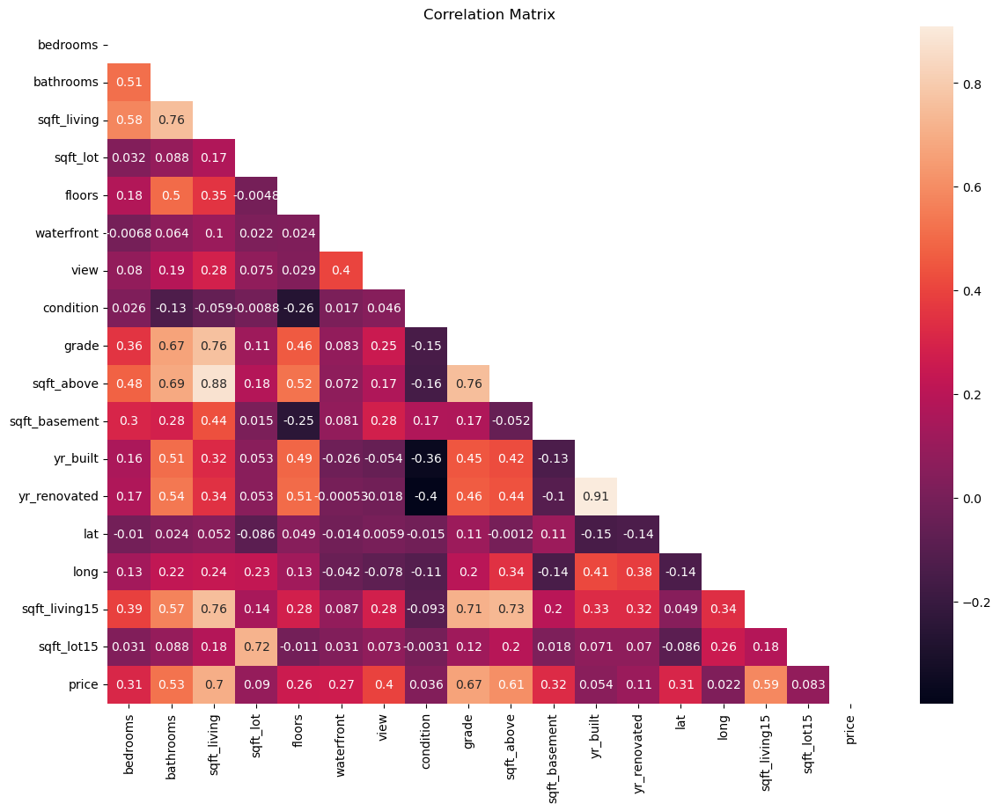

In [14]:
# We check the correlation between the numerical variables.
corr_matrix = data.corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix, mask=mask, annot=True)
plt.title('Correlation Matrix')
plt.show()

**Key findings from the EDA report confirmed by the heatmap:**

- bathrooms is **highly** correlated with sqft_living (0.76), has a medium correlation with floors, grade, sqft_above, yr_built, sqft_living15 and shows a good relation to the target.
- sqft_living has a **high** correlation with grade (0.76), sqft_above (0.88), and sqft_living15 (0.76) and shows the overall **best** relation with the target.
- sqft_lot is **highly** correlated with sqft_lot15 (0.72). sqft_lot shows a slightly better relation with the target.
- grade is **highly** correlated with sqft_living (as mentioned above, 0.76), sqft_above (as mentioned above, 0.76), sqft_living15 (0.71). sqft_above and sqft_living15 are also highly correlated (0.73). As well as with sqft_living (0.88 and 0.76 respectively). Of the four, sqft_living shows the best relation with the target (0.7).
- waterfront is **highly** correlated with view and viceversa.


- The target shows a good relation with sqft_living, grade, sqft_above, sqft_living15 and bathrooms.

Based on these findings we might want to drop the features 'bathrooms', 'sqft_lot15', 'grade', 'sqft_above' and 'sqft_living15'. Plotting the relations in Tableau these assumptions are mostly confirmed, e.g. we can observe that 'sqft_living' shows a better R2 score than 'sqft_living15'. We can drop 'grade' also because it provides us essentially with a similar information as 'condition' (as you can see below).  

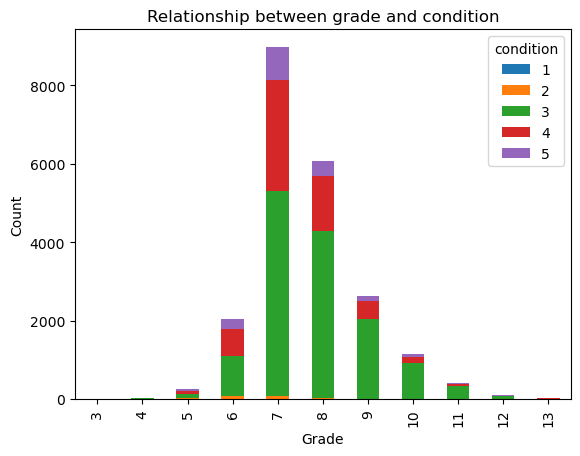

In [15]:
# We group the data by grade and condition.
grouped_data = data.groupby(['grade', 'condition']).size().unstack()

# We create a stacked bar chart.
grouped_data.plot(kind='bar', stacked=True)

# And set the title and axis labels.
plt.title('Relationship between grade and condition')
plt.xlabel('Grade')
plt.ylabel('Count')

plt.show()

In [16]:
# data.drop(['bathrooms', 'sqft_lot15', 'sqft_above', 'sqft_living15'], axis=1, inplace=True)

The latitude and longitude essentially indicate the same as zipcode, so we will drop them.

In [17]:
data.drop(['lat', 'long'], axis=1, inplace=True)

In [18]:
data.columns

Index(['date', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'sqft_living15',
       'sqft_lot15', 'price'],
      dtype='object')

Now we are checking for outliers.

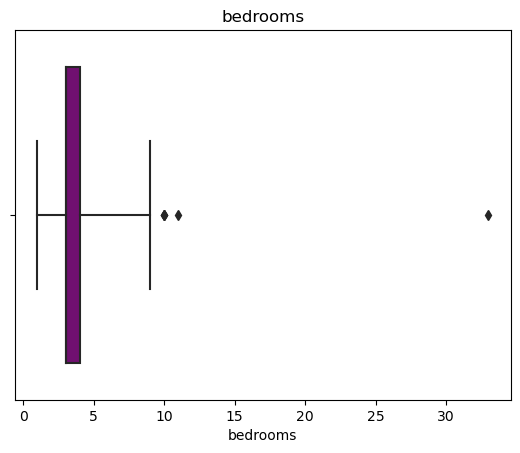

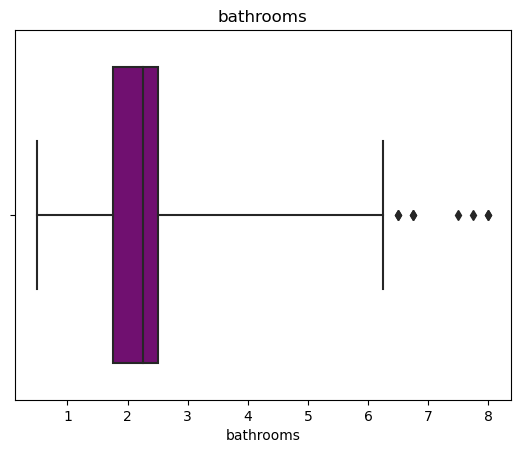

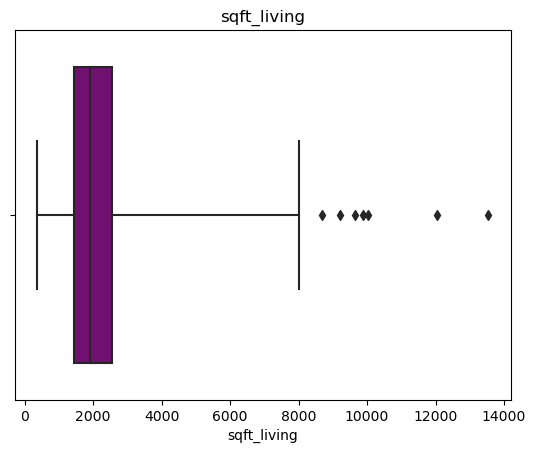

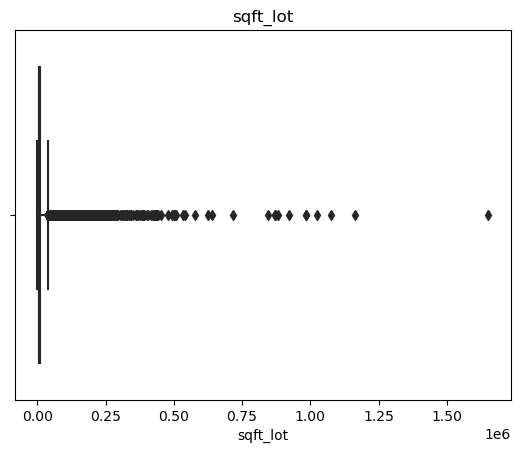

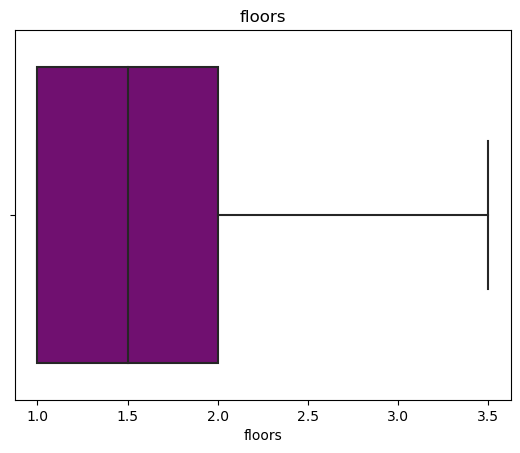

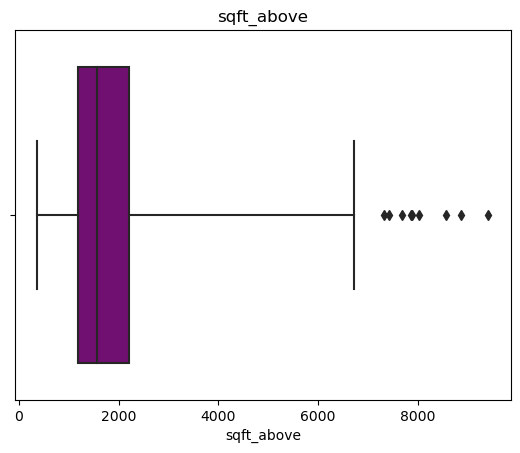

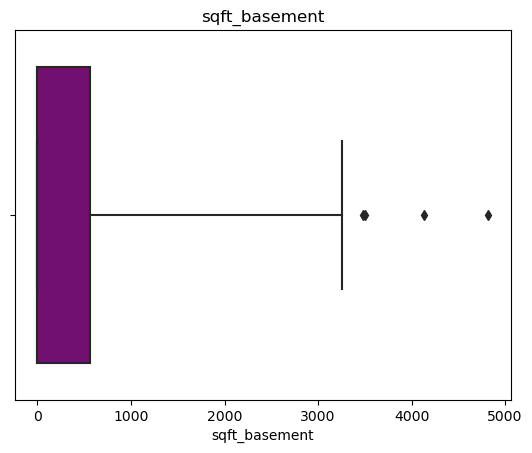

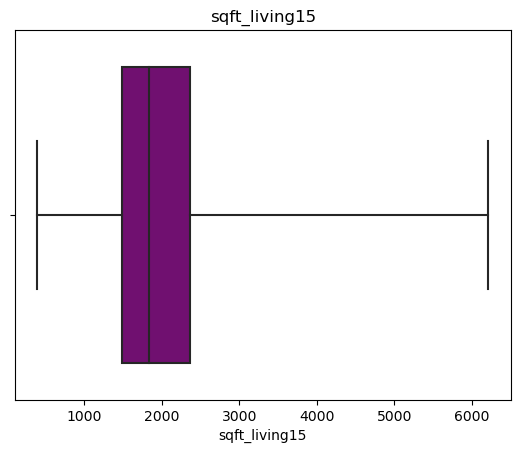

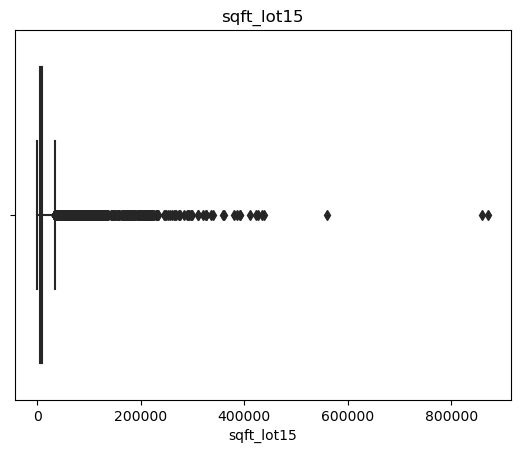

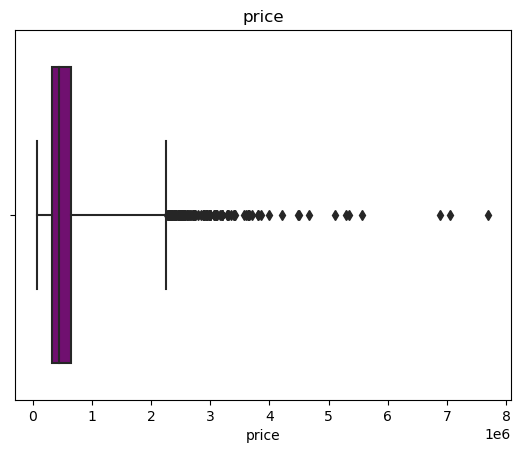

In [19]:
# To create a boxplot for the relevant numerical column. 
cols = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'sqft_above', 'sqft_basement', 'sqft_living15', 'sqft_lot15', 'price']

for col in cols:
    sns.boxplot(x=data[col], whis=5, color='purple')
    plt.title(col)
    plt.show()

# We see in most of the features there's one strong and a couple other outliers.

### 4. Model Benchmarks

In [20]:
# X/y split
X = data.select_dtypes(np.number).drop('price', axis=1)
y = data['price']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [21]:
# Define the model function
def model(x):
    model=x  
    model.fit(X_train, y_train) 
    y_pred=model.predict(X_test) 
    r2 = r2_score(y_test, y_pred)
    MSE = mean_squared_error(y_test, y_pred)
    RMSE = mean_squared_error(y_test, y_pred, squared=False)
    MAE = mean_absolute_error(y_test, y_pred)
    print("Model: ", x)
    print("r2 =", round(r2,2))
    print("MSE =", round(MSE,2))
    print("RMSE =", round(RMSE,2))
    print("MAE =", round(MAE,2))
    print("Adjusted R =", round(1-(1-r2)*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1),2))
    return

##### **Benchmark #3: Multi-layer Perception(MLP)**

##### **Benchmark #4: XGBOOST**

In [22]:
import xgboost as xgb

In [23]:
# Changes to features will be applied to a copy of the original dataset
xgb_data = data.copy()

# Categorical columns to Pandas 'category' data type. The model has its own way to deal with categorical features
for column in xgb_data.columns:
    if xgb_data[column].dtype == object:
        xgb_data[column] = xgb_data[column].astype('category')


In [24]:
# Applying train/test split as usual
X_xgb, y_xgb = xgb_data.drop(columns=['date','price']), xgb_data['price']
y_xgb = xgb_data.price
X_train, X_test, y_train, y_test = train_test_split(X_xgb, y_xgb, test_size = 0.3, random_state = 50)

In [25]:
len(X_test)

6480

In [26]:
# DMatrix: optimized data structure that the creators of XGBoost created
train_dmatrix = xgb.DMatrix(X_train, y_train, enable_categorical=True)
test_dmatrix = xgb.DMatrix(X_test, y_test, enable_categorical=True)

# Setting parameters for the model
parameters = {"booster":"gbtree",                   # ****with gbtree it performs better than with gblinear****
                "objective": "reg:squarederror",    # solving for a linear regression problem
                "tree_method": "hist",              # used for larger datasets
                "subsample": 0.5,                   # 0.5: random sample of half of the training data before trees. Helps avoid overfitting
                "num_parallel_tree": 2,             # how many parallel trees (boosted random forest)
                }

evals = [(train_dmatrix, "train"), (test_dmatrix, "validation")]    # evaluation metrics for the model (RMSE for train and validation set)

model_train = xgb.train(params = parameters,
                  dtrain = train_dmatrix,
                  evals = evals,
                  num_boost_round = 200,            # max iterations to run
                  verbose_eval = 10)                # report scores every 10 rounds


[0]	train-rmse:478166.48906	validation-rmse:474478.11483
[10]	train-rmse:104146.36891	validation-rmse:142983.77645
[20]	train-rmse:89197.83471	validation-rmse:134432.42851
[30]	train-rmse:81975.66261	validation-rmse:132287.06634
[40]	train-rmse:75961.60916	validation-rmse:132105.45135
[50]	train-rmse:71134.69552	validation-rmse:131460.23886
[60]	train-rmse:66969.55017	validation-rmse:131049.74998
[70]	train-rmse:63575.28387	validation-rmse:130966.51740
[80]	train-rmse:60402.96633	validation-rmse:131115.90063
[90]	train-rmse:57518.61852	validation-rmse:131658.72238
[100]	train-rmse:55157.33100	validation-rmse:131760.58577
[110]	train-rmse:52849.58794	validation-rmse:131777.44252
[120]	train-rmse:50791.39134	validation-rmse:131916.47223
[130]	train-rmse:48990.88971	validation-rmse:131948.78627
[140]	train-rmse:47207.54241	validation-rmse:131887.30751
[150]	train-rmse:45514.43562	validation-rmse:132012.16744
[160]	train-rmse:43994.63676	validation-rmse:132100.79004
[170]	train-rmse:42666.

In [27]:
## With num_parallel_tree : 1
# --> [30]	train-rmse:82878.00134	validation-rmse:134017.73932, validation loss can be observed and keeps increasing after round 30

# As the results above indicate ([70]	train-rmse:63575.28387	validation-rmse:130966.51740), validation loss can be observed and keeps increasing after round 70

model_train = xgb.train(params = parameters,
                  dtrain = train_dmatrix,
                  evals = evals,
                  num_boost_round = 72,     # the RMSE score from above for 70 rounds is the best available
                  verbose_eval = 10)

[0]	train-rmse:478166.48906	validation-rmse:474478.11483
[10]	train-rmse:104146.36891	validation-rmse:142983.77645
[20]	train-rmse:89197.83471	validation-rmse:134432.42851
[30]	train-rmse:81975.66261	validation-rmse:132287.06634
[40]	train-rmse:75961.60916	validation-rmse:132105.45135
[50]	train-rmse:71134.69552	validation-rmse:131460.23886
[60]	train-rmse:66969.55017	validation-rmse:131049.74998
[70]	train-rmse:63575.28387	validation-rmse:130966.51740
[71]	train-rmse:63262.80176	validation-rmse:131043.83349


In [28]:
## With num_parallel_tree : 1
# --> [30]	train-rmse:82878.00134	validation-rmse:134017.73932, validation loss can be observed and keeps increasing after round 31

# As the results above indicate ([70]	train-rmse:63575.28387	validation-rmse:130966.51740), validation loss can be observed and keeps increasing after round 70

model_train = xgb.train(params = parameters,
                  dtrain = train_dmatrix,
                  evals = evals,
                  num_boost_round = 71,     # the RMSE score from above for 71 rounds is the best available (index starts at 0)
                  verbose_eval = 10)

[0]	train-rmse:478166.48906	validation-rmse:474478.11483
[10]	train-rmse:104146.36891	validation-rmse:142983.77645
[20]	train-rmse:89197.83471	validation-rmse:134432.42851
[30]	train-rmse:81975.66261	validation-rmse:132287.06634
[40]	train-rmse:75961.60916	validation-rmse:132105.45135
[50]	train-rmse:71134.69552	validation-rmse:131460.23886
[60]	train-rmse:66969.55017	validation-rmse:131049.74998
[70]	train-rmse:63575.28387	validation-rmse:130966.51740


In [29]:
# Using xgb.train and DMatrices

xgb_preds = model_train.predict(test_dmatrix)
xgb_r2 = r2_score(y_test, xgb_preds)
xgb_RMSE = mean_squared_error(y_test, xgb_preds, squared=False)
xgb_MSE = mean_squared_error(y_test, xgb_preds)
xgb_MAE = mean_absolute_error(y_test, xgb_preds)
print("r2 =", round(xgb_r2,2))
print("MSE =", round(xgb_RMSE,2))
print("RMSE =", round(xgb_MSE,2))
print("MAE =", round(xgb_MAE,2))

print("XGBoost base RMSE is", round(xgb_RMSE, 2))

r2 = 0.87
MSE = 130966.52
RMSE = 17152229218.15
MAE = 68825.98
XGBoost base RMSE is 130966.52


In [30]:
# Using xgb.Regressor and the usual train/test split samples

model = xgb.XGBRegressor(n_estimators = 71, booster = 'gbtree', objective = 'reg:squarederror', tree_method = 'hist', subsample = 0.5, num_parallel_tree = 2, enable_categorical = True)
model.fit(X_train, y_train)
xgb_reg_preds = model.predict(X_test)
xgb_reg_r2 = r2_score(y_test, xgb_reg_preds)
xgb_reg_RMSE = mean_squared_error(y_test, xgb_reg_preds, squared=False)
xgb_reg_MSE = mean_squared_error(y_test, xgb_reg_preds)
xgb_reg_MAE = mean_absolute_error(y_test, xgb_reg_preds)
print("r2 =", round(xgb_reg_r2,2))
print("MSE =", round(xgb_reg_RMSE,2))
print("RMSE =", round(xgb_reg_MSE,2))
print("MAE =", round(xgb_reg_MAE,2))

r2 = 0.87
MSE = 130966.52
RMSE = 17152229218.15
MAE = 68825.98
